# Set Up
- Download the ECG dataset hosted on kaggle. **This step requires a Kaggle API token.**
- Clone the project repository to access the experiment models

In [1]:
!pip install -q kaggle
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=68b956f6f790867b90890c00ca04c1b2c96962cd3913bc56afc91e125da9a24e
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [2]:
from google.colab import files

uploaded = files.upload()

# make sure there is a kaggle.json file
!ls -lha kaggle.json

# install the Kaggle API token
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json
-rw-r--r-- 1 root root 67 Nov 29 04:55 kaggle.json


In [3]:
# download and unzip the ECG dataset hosted on kaggle
!kaggle datasets download -d shayanfazeli/heartbeat
!unzip -q heartbeat.zip

# clone the project github repository
!git clone https://github.com/distributedgarden/tsc_attention.git

 97% 96.0M/98.8M [00:02<00:00, 43.0MB/s]
100% 98.8M/98.8M [00:02<00:00, 34.7MB/s]
Cloning into 'tsc_attention'...
remote: Enumerating objects: 184, done.
remote: Counting objects: 100% (184/184), done.
remote: Compressing objects: 100% (125/125), done.
remote: Total 184 (delta 101), reused 124 (delta 54), pack-reused 0
Receiving objects: 100% (184/184), 1.81 MiB | 5.73 MiB/s, done.
Resolving deltas: 100% (101/101), done.


# LSTM Experiment
### Description:
Use the ECG dataset to train the basic LSTM model and evaluate its performance.


### Steps:
1. split the ECG data into train and test subsets
1. preprocess the subsets (standard scaling)
1. convert to pytorch tensors
1. set up the LSTM model
1. train the LSTM model
1. evaluate performance with accuracy, F1 score, precision, recall

In [4]:
import lime
import lime.lime_tabular
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from torch.utils.data import DataLoader, TensorDataset
from IPython.core.display import HTML



%cd tsc_attention
from src.models.os_cnn import OSCNN
from src.models.attention_os_cnn import AttentionOSCNN
%cd ..


/content/tsc_attention
/content


In [5]:
# load data
train_df = pd.read_csv("mitbih_train.csv", header=None)
test_df = pd.read_csv("mitbih_test.csv", header=None)

# last column is the label
X_train = train_df.iloc[:, :-1].values
y_train = train_df.iloc[:, -1].values
X_test = test_df.iloc[:, :-1].values
y_test = test_df.iloc[:, -1].values

print(len(train_df))
print(len(test_df))
print(len(X_train[1]))
print(X_train[1])

87554
21892
187
[0.96011394 0.86324787 0.46153846 0.1965812  0.0940171  0.12535612
 0.0997151  0.08831909 0.07407407 0.08262108 0.07407407 0.06267806
 0.06552707 0.06552707 0.06267806 0.07692308 0.07122507 0.08262108
 0.09116809 0.09686609 0.08262108 0.08262108 0.09116809 0.10541311
 0.12250713 0.14814815 0.18233618 0.19373219 0.21367522 0.20797721
 0.22222222 0.25356126 0.27065527 0.28774929 0.28490028 0.29344729
 0.25641027 0.24786325 0.18803419 0.14529915 0.10826211 0.08262108
 0.07977208 0.07407407 0.01424501 0.01139601 0.06267806 0.05128205
 0.05698006 0.04843305 0.02849003 0.03133903 0.07692308 0.02564103
 0.02849003 0.03703704 0.0940171  0.08547009 0.03988604 0.05982906
 0.07407407 0.07977208 0.09116809 0.0997151  0.10826211 0.08831909
 0.09116809 0.06552707 0.08547009 0.08831909 0.07692308 0.08262108
 0.09686609 0.0997151  0.13390313 0.1025641  0.03988604 0.06552707
 0.07407407 0.08262108 0.08547009 0.05698006 0.04558405 0.1025641
 0.03988604 0.01139601 0.01709402 0.03133903 0.

In [6]:
# normalize the ECG signals
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# convert to tensors
X_train_tensor = torch.tensor(X_train).float().unsqueeze(2)  # Adding channel dimension
y_train_tensor = torch.tensor(y_train).long()
X_test_tensor = torch.tensor(X_test).float().unsqueeze(2)  # Adding channel dimension
y_test_tensor = torch.tensor(y_test).long()

# Dataset objects
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

# DataLoaders
batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)


In [7]:
# set parameters
# ECG data is univariate, so the input dimension is 1
#input_dim = 1
#hidden_dim = 128
#num_layers = 2
num_classes = 5

model = OSCNN(num_classes)

# loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

print(model)

OSCNN(
  (conv1): Conv1d(1, 128, kernel_size=(8,), stride=(1,), padding=same)
  (bn1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv1d(128, 256, kernel_size=(5,), stride=(1,), padding=same)
  (bn2): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv1d(256, 128, kernel_size=(3,), stride=(1,), padding=same)
  (bn3): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (avg_pool): AdaptiveAvgPool1d(output_size=1)
  (fc): Linear(in_features=128, out_features=5, bias=True)
)


In [8]:
def evaluate(trained_model, attention=False):
    # evaluate
    trained_model.eval()

    true_labels = []
    predicted_labels = []
    incorrect_indexes = []
    attention_maps = []
    index = 0

    with torch.no_grad():
        for inputs, labels in test_loader:
            outputs = trained_model(inputs)
            _, predicted = torch.max(outputs.data, 1)
            true_labels.append(labels)
            predicted_labels.append(predicted)

            if attention:
                attention_maps.append(trained_model.attention_weights.cpu().numpy())

            # collect incorrect predictions
            mismatches = (predicted != labels)
            incorrect_batch_indexes = np.where(mismatches.cpu().numpy())[0]
            incorrect_batch_indexes += index  # adjust index to match global position in dataset
            incorrect_indexes.extend(incorrect_batch_indexes.tolist())

            index += len(labels)  # update index

    # combine lists of results
    true_labels = torch.cat(true_labels).cpu().numpy()
    predicted_labels = torch.cat(predicted_labels).cpu().numpy()

    # metrics
    accuracy = accuracy_score(true_labels, predicted_labels)
    precision = precision_score(true_labels, predicted_labels, average="weighted")
    recall = recall_score(true_labels, predicted_labels, average="weighted")
    f1 = f1_score(true_labels, predicted_labels, average="weighted")

    print(f"Accuracy: {accuracy * 100:.2f}%")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1 Score: {f1:.4f}")

    return accuracy, precision, recall, f1, incorrect_indexes, attention_maps

In [9]:
def plot_metrics(accuracies, precisions, recalls, f1_scores, losses):
    # plotting
    plt.figure(figsize=(12, 8))
    plt.subplot(2, 1, 1)
    plt.plot(accuracies, label="Accuracy")
    plt.plot(precisions, label="Precision")
    plt.plot(recalls, label="Recall")
    plt.plot(f1_scores, label="F1 Score")
    plt.title("Metrics over Epochs")
    plt.xlabel("Epoch")
    plt.ylabel("Metric")
    plt.legend()

    plt.subplot(2, 1, 2)
    plt.plot(losses, label="Loss", color="red")
    plt.title("Loss over Epochs")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()

    plt.tight_layout()
    plt.show()

In [10]:
# store metrics for display
accuracies = []
precisions = []
recalls = []
f1_scores = []
losses = []
incorrect_indexes = []

# train
num_epochs = 10
for epoch in range(num_epochs):
    model.train()
    total_loss = 0
    for i, (inputs, labels) in enumerate(train_loader):
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

        if (i+1) % 100 == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{len(train_loader)}], Loss: {loss.item():.4f}")

    # average loss for this epoch
    epoch_loss = total_loss / len(train_loader)
    losses.append(epoch_loss)

    # store metrics
    accuracy, precision, recall, f1, epoch_incorrect_indexes, _ = evaluate(model)
    accuracies.append(accuracy)
    precisions.append(precision)
    recalls.append(recall)
    f1_scores.append(f1)
    incorrect_indexes.append(epoch_incorrect_indexes)


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:306: UserWarning: Using padding='same' with even kernel lengths and odd dilation may require a zero-padded copy of the input be created (Triggered internally at ../aten/src/ATen/native/Convolution.cpp:1008.)
  return F.conv1d(input, weight, bias, self.stride,


Epoch [1/10], Step [100/2737], Loss: 0.4922


KeyboardInterrupt: ignored

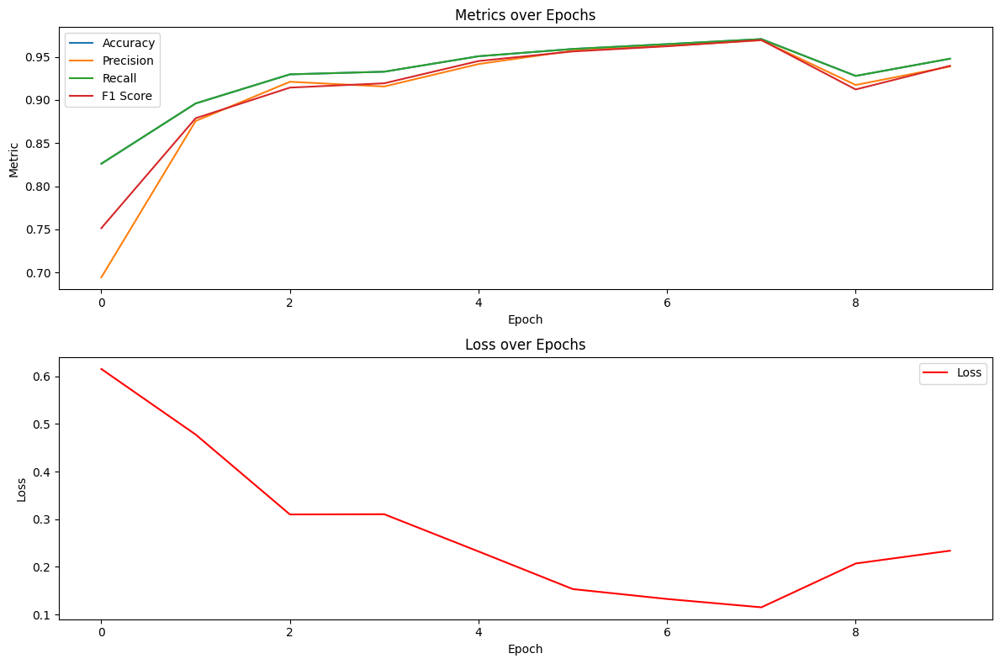

In [ ]:
plot_metrics(accuracies, precisions, recalls, f1_scores, losses)

In [11]:
def plot_incorrect_predictions(incorrect_indexes):
    label_frequencies_per_epoch = []

    all_labels = []
    for _, labels in test_loader:
        all_labels.extend(labels.tolist())

    for epoch_indexes in incorrect_indexes:
        incorrect_labels = [all_labels[idx] for idx in epoch_indexes]
        labels, counts = np.unique(incorrect_labels, return_counts=True)
        label_frequencies_per_epoch.append(dict(zip(labels, counts)))

    all_possible_labels = set(all_labels)

    plot_data = {label: [] for label in all_possible_labels}
    for epoch_data in label_frequencies_per_epoch:
        for label in all_possible_labels:
            plot_data[label].append(epoch_data.get(label, 0))

    # plot
    plt.figure(figsize=(12, 8))
    for label, counts in plot_data.items():
        plt.plot(counts, label=f"Label {label}")

    plt.title("Frequency of Label Misclassification per Epoch")
    plt.xlabel("Epoch")
    plt.ylabel("Frequency of Label Misclassification")
    plt.legend()
    plt.xticks(range(len(label_frequencies_per_epoch)))
    plt.grid(True)
    plt.show()


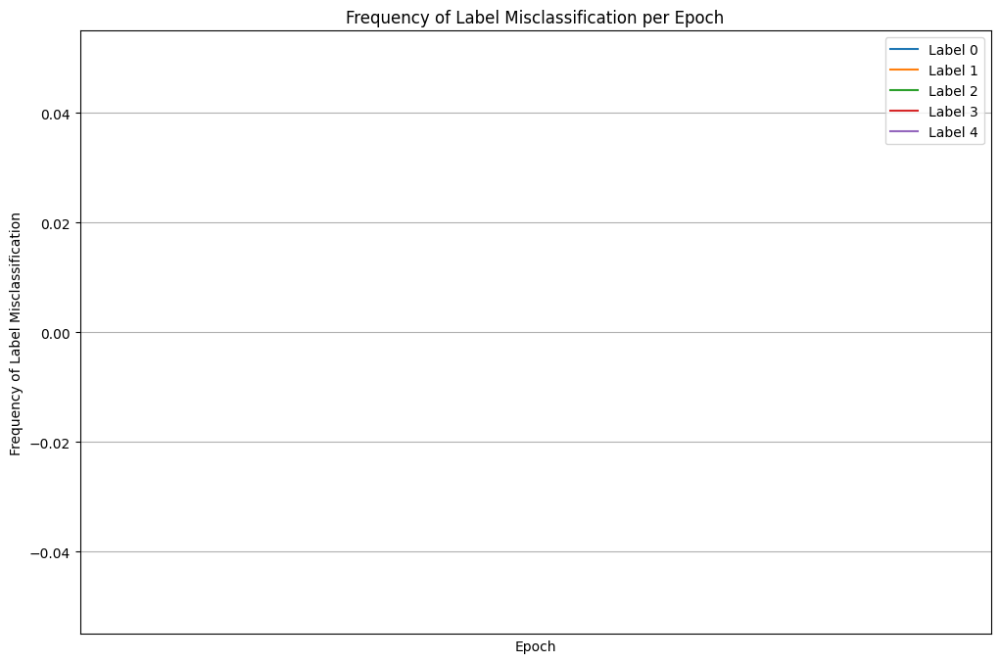

In [12]:
plot_incorrect_predictions(incorrect_indexes)

# LSTM LIME Analysis

In [ ]:
def batch_predict(data):
    model.eval()
    data_tensor = torch.tensor(data).float().unsqueeze(2)

    if next(model.parameters()).is_cuda:
        data_tensor = data_tensor.cuda()

    with torch.no_grad():
        outputs = model(data_tensor)

    probabilities = torch.nn.functional.softmax(outputs, dim=1).cpu().numpy()
    return probabilities

# LimeTabularExplainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train,    # raw data; not tensored or scaled
    feature_names=[f"timepoint_{i}" for i in range(X_train.shape[1])],
    class_names=[str(i) for i in np.unique(y_train)],
    mode="classification"
)

# instances to explain
indexes_to_explain = [0, 1, 2, incorrect_indexes[-1][0]]  # Replace with your list of indexes

for test_idx in indexes_to_explain:
    test_instance = X_test[test_idx]

    true_label = y_test[test_idx]
    #model_prediction = model(batch_predict([test_instance])[0])

    test_instance_tensor = torch.tensor(test_instance).float().unsqueeze(0).unsqueeze(2)  # Add batch and channel dimensions
    if next(model.parameters()).is_cuda:
        test_instance_tensor = test_instance_tensor.cuda()

    model.eval()
    with torch.no_grad():
        model_output = model(test_instance_tensor)
        _, predicted_label = torch.max(model_output.data, 1)

    print(f"Instance {test_idx}:")
    #print(f"Predicted Label: {model_prediction}, True Label: {true_label}")
    print(f"Predicted Label: {predicted_label.item()}, True Label: {true_label}")

    unique_classes = [i for i in range(len(np.unique(y_train)))]
    explanation = explainer.explain_instance(
        test_instance,
        batch_predict,
        labels=unique_classes,
        num_features=200
    )

    explanation_html = explanation.as_html()
    display(HTML(explanation_html))

Instance 0:
Predicted Label: 0, True Label: 0.0


Instance 1:
Predicted Label: 0, True Label: 0.0


Instance 2:
Predicted Label: 0, True Label: 0.0


Instance 159:
Predicted Label: 2, True Label: 0.0


# LSTM with Attention Experiment
### Description
Use the ECG dataset to train the LSTM+Attention model and evaluate its performance.

### Steps
1. set up the LSTM+Attention model
1. train the LSTM+Attention model
1. evaluate performance with accuracy, F1 score, precision, recall

In [16]:
# set parameters
input_dim = 187
hidden_dim = 128
num_layers = 2
num_classes = 5

attention_model = AttentionOSCNN(
    num_classes,
    hidden_size=hidden_dim,
    input_size=input_dim,
    intermediate_size=hidden_dim,
)

# loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(attention_model.parameters(), lr=0.001)

print(attention_model)

AttentionOSCNN(
  (conv1): Conv1d(1, 128, kernel_size=(8,), stride=(1,), padding=same)
  (bn1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv1d(128, 256, kernel_size=(5,), stride=(1,), padding=same)
  (bn2): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv1d(256, 128, kernel_size=(3,), stride=(1,), padding=same)
  (bn3): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (intermediate): Linear(in_features=187, out_features=128, bias=True)
  (attention): SelfAttention(
    (query): Linear(in_features=128, out_features=128, bias=True)
    (key): Linear(in_features=128, out_features=128, bias=True)
    (value): Linear(in_features=128, out_features=128, bias=True)
  )
  (avg_pool): AdaptiveAvgPool1d(output_size=1)
  (fc): Linear(in_features=128, out_features=5, bias=True)
)


In [17]:
# store metrics for display
accuracies = []
precisions = []
recalls = []
f1_scores = []
losses = []
incorrect_indexes = []
attention_maps = []

# train
num_epochs = 10
for epoch in range(num_epochs):
    attention_model.train()
    total_loss = 0

    for i, (inputs, labels) in enumerate(train_loader):
        optimizer.zero_grad()
        outputs = attention_model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

        if (i+1) % 100 == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{len(train_loader)}], Loss: {loss.item():.4f}")

    accuracy, precision, recall, f1, epoch_incorrect_indexes, epoch_attention_maps = evaluate(attention_model, attention=True)

    # average loss for this epoch
    epoch_loss = total_loss / len(train_loader)
    losses.append(epoch_loss)

    # store metrics
    accuracies.append(accuracy)
    precisions.append(precision)
    recalls.append(recall)
    f1_scores.append(f1)
    incorrect_indexes.append(epoch_incorrect_indexes)
    attention_maps.append(epoch_attention_maps)


Epoch [1/10], Step [100/2737], Loss: 0.3528
Epoch [1/10], Step [200/2737], Loss: 0.1726
Epoch [1/10], Step [300/2737], Loss: 0.1955
Epoch [1/10], Step [400/2737], Loss: 0.0775
Epoch [1/10], Step [500/2737], Loss: 0.2692
Epoch [1/10], Step [600/2737], Loss: 0.1537
Epoch [1/10], Step [700/2737], Loss: 0.4682
Epoch [1/10], Step [800/2737], Loss: 0.2068
Epoch [1/10], Step [900/2737], Loss: 0.3590
Epoch [1/10], Step [1000/2737], Loss: 0.6602
Epoch [1/10], Step [1100/2737], Loss: 0.1169
Epoch [1/10], Step [1200/2737], Loss: 0.6297
Epoch [1/10], Step [1300/2737], Loss: 0.3664
Epoch [1/10], Step [1400/2737], Loss: 0.4189
Epoch [1/10], Step [1500/2737], Loss: 0.2970
Epoch [1/10], Step [1600/2737], Loss: 0.6402
Epoch [1/10], Step [1700/2737], Loss: 0.2239
Epoch [1/10], Step [1800/2737], Loss: 0.0750
Epoch [1/10], Step [1900/2737], Loss: 0.4977
Epoch [1/10], Step [2000/2737], Loss: 0.7082
Epoch [1/10], Step [2100/2737], Loss: 0.2664
Epoch [1/10], Step [2200/2737], Loss: 0.2836
Epoch [1/10], Step 

KeyboardInterrupt: ignored

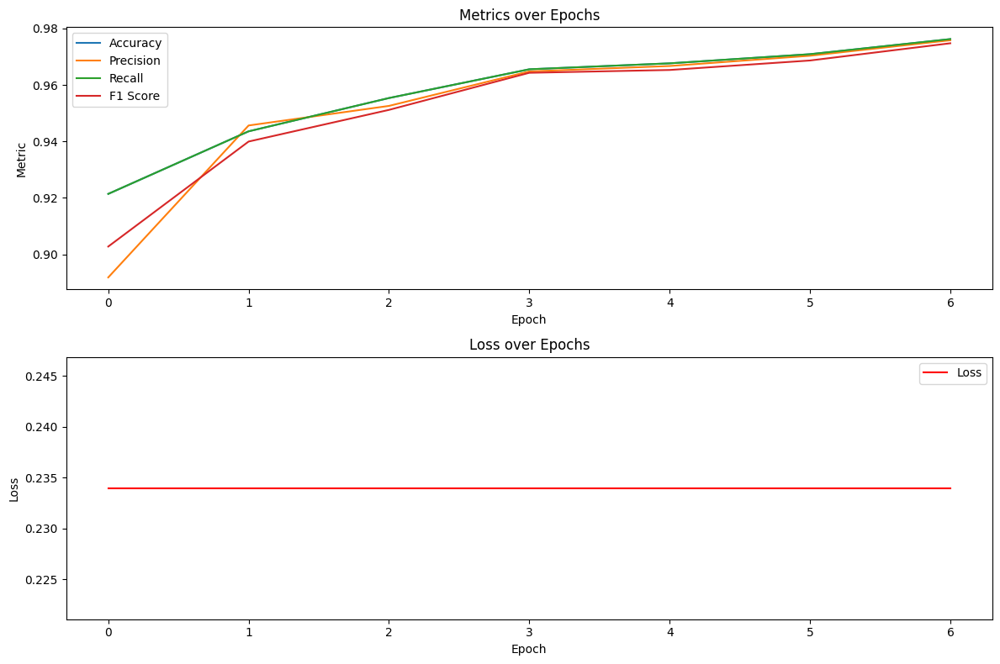

In [ ]:
plot_metrics(accuracies, precisions, recalls, f1_scores, losses)

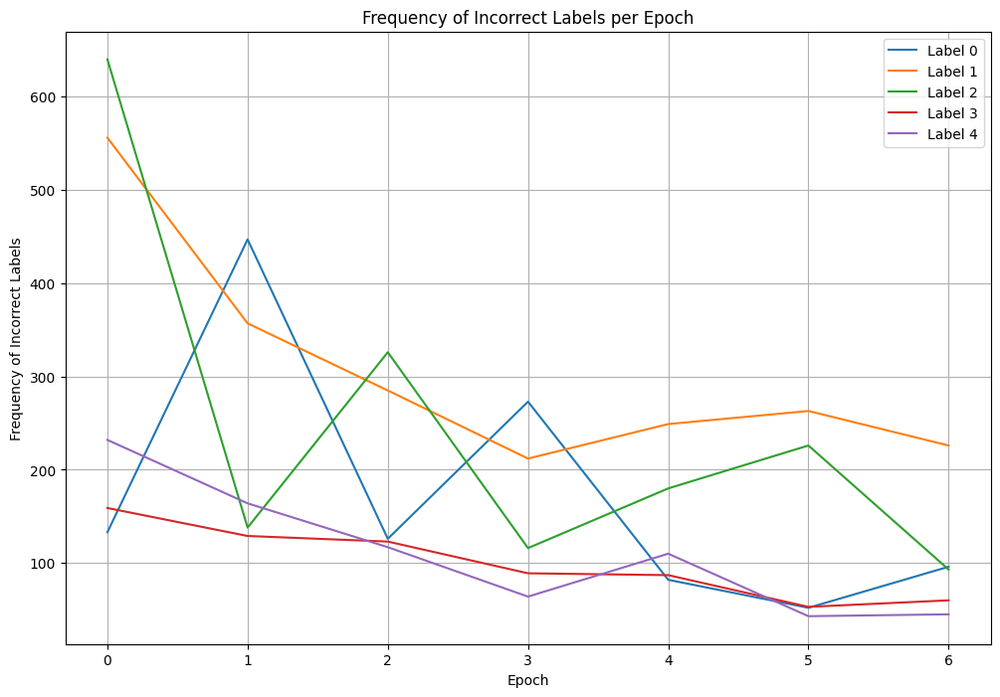

In [ ]:
plot_incorrect_predictions(incorrect_indexes)

# LSTM with Attention LIME Analysis

In [ ]:
def batch_predict(data):
    attention_model.eval()
    data_tensor = torch.tensor(data).float().unsqueeze(2)

    if next(attention_model.parameters()).is_cuda:
        data_tensor = data_tensor.cuda()

    with torch.no_grad():
        outputs = attention_model(data_tensor)

    probabilities = torch.nn.functional.softmax(outputs, dim=1).cpu().numpy()

    return probabilities

# LimeTabularExplainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train,    # raw data; not tensored or scaled
    feature_names=[f"timepoint_{i}" for i in range(X_train.shape[1])],
    class_names=[str(i) for i in np.unique(y_train)],
    mode="classification"
)

# instances to explain
indexes_to_explain = [0, 1, 2, incorrect_indexes[-1][0]]  # Replace with your list of indexes

for test_idx in indexes_to_explain:
    test_instance = X_test[test_idx]

    true_label = y_test[test_idx]

    test_instance_tensor = torch.tensor(test_instance).float().unsqueeze(0).unsqueeze(2)  # Add batch and channel dimensions
    if next(attention_model.parameters()).is_cuda:
        test_instance_tensor = test_instance_tensor.cuda()

    attention_model.eval()
    with torch.no_grad():
        model_output = attention_model(test_instance_tensor)
        _, predicted_label = torch.max(model_output.data, 1)

    print(f"Instance {test_idx}:")
    print(f"Predicted Label: {predicted_label.item()}, True Label: {true_label}")

    unique_classes = [i for i in range(len(np.unique(y_train)))]
    explanation = explainer.explain_instance(
        test_instance,
        batch_predict,
        labels=unique_classes,
        num_features=10
    )

    explanation_html = explanation.as_html()
    display(HTML(explanation_html))

Instance 0:
Predicted Label: 0, True Label: 0.0


Instance 1:
Predicted Label: 0, True Label: 0.0


Instance 2:
Predicted Label: 0, True Label: 0.0


Instance 159:
Predicted Label: 2, True Label: 0.0


# Attention Weights Heatmap

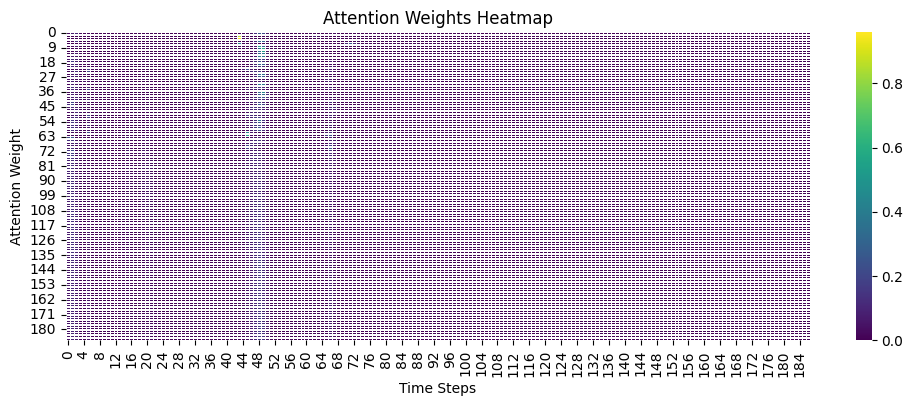

In [ ]:
sample_idx = 122

sample_input = X_test_tensor[sample_idx].cpu().numpy()
batch_weights = attention_maps[-1][sample_idx//batch_size]
sample_attention = batch_weights[sample_idx%batch_size]

# plot heatmap
plt.figure(figsize=(12, 4))
sns.heatmap(sample_attention, cmap="viridis", linewidths=0.5)
plt.title("Attention Weights Heatmap")
plt.xlabel("Time Steps")
plt.ylabel("Attention Weight")
plt.show()

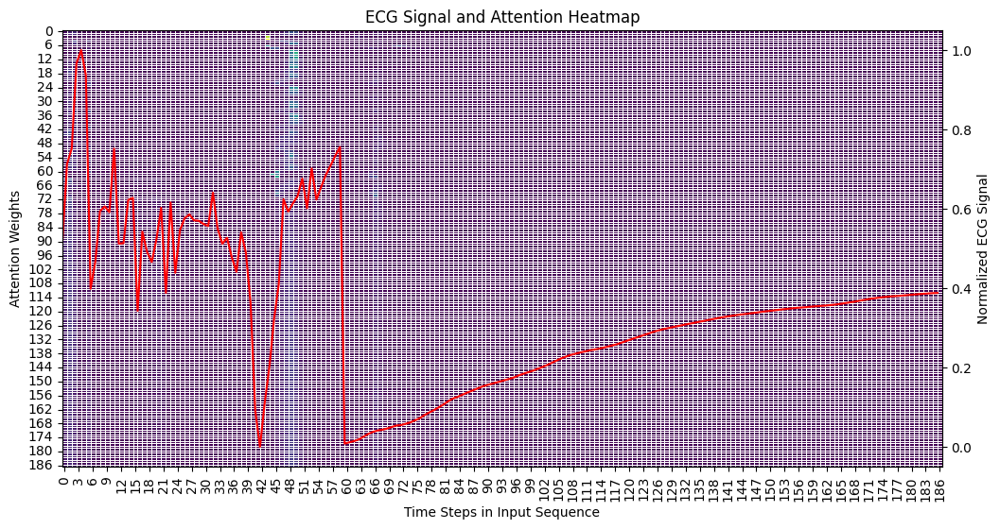

In [ ]:
# normalize ECG signal for visualization
normalized_ecg_sample = (sample_input - sample_input.min()) / (sample_input.max() - sample_input.min())

# create figure and axis
fig, ax1 = plt.subplots(figsize=(12, 6))

# plot heatmap
sns.heatmap(sample_attention, cmap="viridis", linewidths=0.5, ax=ax1, cbar=False)
ax1.set_xlabel("Time Steps in Input Sequence")
ax1.set_ylabel("Attention Weights")
ax1.set_title("ECG Signal and Attention Heatmap")

# create a second y-axis for the ECG signal
ax2 = ax1.twinx()
ax2.plot(normalized_ecg_sample, color="r")
ax2.set_ylabel("Normalized ECG Signal")

plt.show()

In [ ]:
# load data
ptbdb_abnormal = pd.read_csv("ptbdb_abnormal.csv", header=None)
ptbdb_normal = pd.read_csv("ptbdb_normal.csv", header=None)

# last column is the label
X_abnormal = ptbdb_abnormal.iloc[:, :-1].values
y_abnormal = ptbdb_abnormal.iloc[:, -1].values
X_normal = ptbdb_normal.iloc[:, :-1].values
y_normal = ptbdb_normal.iloc[:, -1].values

In [ ]:
# normalize the ECG signals
scaler = StandardScaler()
X_abnormal = scaler.fit_transform(X_abnormal)
X_normal = scaler.transform(X_normal)

# convert to tensors
X_ab_tensor = torch.tensor(X_abnormal).float().unsqueeze(2)  # Adding channel dimension
y_ab_tensor = torch.tensor(y_abnormal).long()
X_no_tensor = torch.tensor(X_normal).float().unsqueeze(2)  # Adding channel dimension
y_no_tensor = torch.tensor(y_normal).long()

# Dataset objects
abnormal_dataset = TensorDataset(X_ab_tensor, y_ab_tensor)
normal_dataset = TensorDataset(X_no_tensor, y_no_tensor)

# DataLoaders
batch_size = 32
abnormal_loader = DataLoader(abnormal_dataset, batch_size=batch_size, shuffle=True)
normal_loader = DataLoader(normal_dataset, batch_size=batch_size, shuffle=False)

In [ ]:
true_labels = []
predicted_labels = []
attention_maps = []

with torch.no_grad():
    for inputs, labels in abnormal_loader:
        outputs = attention_model(inputs)
        probabilities = F.softmax(outputs, dim=1)  # Apply softmax to convert logits to probabilities
        _, predicted = torch.max(probabilities, 1)

        true_labels.append(labels)
        predicted_labels.append(predicted)
        attention_maps.append(attention_model.attention_weights.cpu().numpy())

# combine lists of results
true_labels = torch.cat(true_labels).cpu().numpy()
predicted_labels = torch.cat(predicted_labels).cpu().numpy()

# metrics
accuracy = accuracy_score(true_labels, predicted_labels)
precision = precision_score(true_labels, predicted_labels, average="weighted")
recall = recall_score(true_labels, predicted_labels, average="weighted")
f1 = f1_score(true_labels, predicted_labels, average="weighted")

print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

In [ ]:
print(true_labels[0])

In [ ]:
true_labels = []
predicted_labels = []
attention_maps = []

with torch.no_grad():
    for inputs, labels in normal_loader:
        outputs = attention_model(inputs)
        probabilities = F.softmax(outputs, dim=1)  # Apply softmax to convert logits to probabilities
        _, predicted = torch.max(probabilities, 1)

        true_labels.append(labels)
        predicted_labels.append(predicted)
        attention_maps.append(attention_model.attention_weights.cpu().numpy())

# combine lists of results
true_labels = torch.cat(true_labels).cpu().numpy()
predicted_labels = torch.cat(predicted_labels).cpu().numpy()

# metrics
accuracy = accuracy_score(true_labels, predicted_labels)
precision = precision_score(true_labels, predicted_labels, average="weighted")
recall = recall_score(true_labels, predicted_labels, average="weighted")
f1 = f1_score(true_labels, predicted_labels, average="weighted")

print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

In [ ]:
true_labels = []
predicted_labels = []
attention_maps = []

with torch.no_grad():
    for inputs, labels in abnormal_loader:
        outputs = model(inputs)
        probabilities = F.softmax(outputs, dim=1)  # Apply softmax to convert logits to probabilities
        _, predicted = torch.max(probabilities, 1)

        true_labels.append(labels)
        predicted_labels.append(predicted)

# combine lists of results
true_labels = torch.cat(true_labels).cpu().numpy()
predicted_labels = torch.cat(predicted_labels).cpu().numpy()

# metrics
accuracy = accuracy_score(true_labels, predicted_labels)
precision = precision_score(true_labels, predicted_labels, average="weighted")
recall = recall_score(true_labels, predicted_labels, average="weighted")
f1 = f1_score(true_labels, predicted_labels, average="weighted")

print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

In [ ]:
true_labels = []
predicted_labels = []
attention_maps = []

with torch.no_grad():
    for inputs, labels in normal_loader:
        outputs = model(inputs)
        probabilities = F.softmax(outputs, dim=1)  # Apply softmax to convert logits to probabilities
        _, predicted = torch.max(probabilities, 1)

        true_labels.append(labels)
        predicted_labels.append(predicted)

# combine lists of results
true_labels = torch.cat(true_labels).cpu().numpy()
predicted_labels = torch.cat(predicted_labels).cpu().numpy()

# metrics
accuracy = accuracy_score(true_labels, predicted_labels)
precision = precision_score(true_labels, predicted_labels, average="weighted")
recall = recall_score(true_labels, predicted_labels, average="weighted")
f1 = f1_score(true_labels, predicted_labels, average="weighted")

print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")